In [1]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path
from sklearn.cluster import KMeans

In [2]:
import sys

sys.path.append("../src")
sys.path.append("../src/bout")

In [3]:
from core import SITE_NAMES, FREQUENCY_COLOR_MAPPINGS
import clustering as clstr
import bout as bt
import plot as bt_plt
import activity.subsampling as ss
import activity.activity_assembly as actvt

from cli import get_file_paths
from calls import plot_call_features, compute_features, call_extraction

['/Users/adityakrishna/duty-cycle-investigation/daily_notebook', '/Users/adityakrishna/miniconda3/envs/dc-study/lib/python311.zip', '/Users/adityakrishna/miniconda3/envs/dc-study/lib/python3.11', '/Users/adityakrishna/miniconda3/envs/dc-study/lib/python3.11/lib-dynload', '', '/Users/adityakrishna/miniconda3/envs/dc-study/lib/python3.11/site-packages', '../src', '../src/bout', '../src/bout', '../src/bout', '../src/bout', '../src', '../src', '../src/activity', '/Users/adityakrishna/duty-cycle-investigation/daily_notebook/../src/calls', '/Users/adityakrishna/duty-cycle-investigation/daily_notebook/../src', '/Users/adityakrishna/duty-cycle-investigation/daily_notebook/../src/bout', '/Users/adityakrishna/duty-cycle-investigation/daily_notebook/../src']


In [4]:
FREQUENCY_COLOR_MAPPINGS = {
                    'LF' : 'cyan',
                    'HF' : 'orange'
                        }

LABEL_FOR_GROUPS = {
                    0: 'LF', 
                    1: 'HF'
                    }

FIGSIZE = (12, 6)

DURATION = 300

In [5]:
PADDED_CALL_LENGTH = 0.06

def open_and_get_call_info(audio_file, kmean_welch, dets):
    fs = audio_file.samplerate
    call_signals = []
    welch_signals = []
    snrs = []
    peak_freqs = []
    classes = []
    nyquist = fs//2
    for index, row in dets.iterrows():
        call_dur = (row['end_time'] - row['start_time'])
        pad = 0.004
        start = row['start_time'] - call_dur - (3*pad)
        duration = (2 * call_dur) + (4*pad)
        end = row['end_time']
        audio_file.seek(int(fs*start))
        audio_seg = audio_file.read(int(fs*duration))
        
        low_freq_cutoff = row['low_freq']-5000
        high_freq_cutoff = min(nyquist-1, row['high_freq']+5000)
        band_limited_audio_seg = call_extraction.bandpass_audio_signal(audio_seg, fs, low_freq_cutoff, high_freq_cutoff)

        signal = band_limited_audio_seg.copy()
        signal[:int(fs*(call_dur+(2*pad)))] = 0

        noise = band_limited_audio_seg - signal

        snr_call_signal = signal[-int(fs*(call_dur+(2*pad))):]
        snr_noise_signal = noise[:int(fs*(call_dur+(2*pad)))]
        call_signals.append(snr_call_signal)

        snr = call_extraction.get_snr_from_band_limited_signal(snr_call_signal, snr_noise_signal)
        snrs.append(snr)

        welch_info = dict()
        welch_info['num_points'] = 100
        max_visible_frequency = 96000
        welch_info['max_freq_visible'] = max_visible_frequency
        welch_signal = compute_features.compute_welch_psd_of_call(snr_call_signal, fs, welch_info)
        welch_signals.append(welch_signal)

        peaks = np.where(welch_signal==max(welch_signal))[0][0]
        peak_freqs.append((96000/100)*peaks)
        
        welch_signal = (welch_signal).reshape(1, len(welch_signal))
        classes.append(kmean_welch.predict(welch_signal)[0])

    call_signals = np.array(call_signals, dtype='object')

    dets.reset_index(drop=True, inplace=True)
    dets['index'] = dets.index
    dets['file_name'] = pd.DatetimeIndex(pd.to_datetime(dets['input_file'], format='%Y%m%d_%H%M%S', exact=False)).strftime('%Y%m%d_%H%M%S.WAV')
    dets['sampling_rate'] = len(dets) * [fs]
    dets['SNR'] = snrs
    dets['KMEANS_CLASSES'] = pd.Series(classes).map(LABEL_FOR_GROUPS)
    dets['peak_frequency'] = peak_freqs

    return call_signals, dets

In [6]:
def plot_colored_dets_over_audio_seg(audio_features, spec_features, plot_dets):
    """
    Function to plot the spectrogram of a provided audio segment with overlayed detections
    """

    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    plt.figure(figsize=FIGSIZE)
    plt.rcParams.update({'font.size': 24})
    plt.title(f"BatDetect2 detections on {audio_features['file_path'].name}", fontsize=22)
    plt.specgram(audio_seg, NFFT=spec_features['NFFT'], cmap=spec_features['cmap'], vmin=spec_features['vmin'])

    yellow_patch = patches.Patch(facecolor='yellow', edgecolor='k', label='Detections')

    legend_patches = [yellow_patch]
    ax = plt.gca()
    for i, row in plot_dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start)*(fs/2), row['low_freq']/(fs/2)), 
                        (row['end_time'] - row['start_time'])*(fs/2), (row['high_freq'] - row['low_freq'])/(fs/2), 
                        linewidth=2, edgecolor=FREQUENCY_COLOR_MAPPINGS[row['KMEANS_CLASSES']], facecolor='none', alpha=1)
        
        ax.add_patch(rect)

    plt.yticks(ticks=np.linspace(0, 96000/(fs/2), 11), labels=np.linspace(0, 96, 11).astype('int'))
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), labels=np.round(np.linspace(start, start+duration, 11, dtype='float'), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.ylim(0, 96000/(fs/2))
    plt.xlabel("Time (s)")
    plt.gcf().autofmt_xdate()
    plt.grid(axis='y')
    plt.legend(handles=legend_patches, fontsize=20, ncol=int(len(legend_patches)**0.5), loc='upper right')

    plt.tight_layout()
    plt.show()

def plot_audio_seg(audio_features, spec_features):
    """
    Function to plot the spectrogram of a provided audio segment
    """

    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    plt.figure(figsize=FIGSIZE)
    plt.rcParams.update({'font.size' : 24})
    plt.title(f"Audio collected from {audio_features['site_name']} on {audio_features['file_datetime']} UTC", fontsize=22)
    plt.rcParams.update({'font.size': 24})
    plt.specgram(audio_seg, NFFT=spec_features['NFFT'], cmap=spec_features['cmap'], vmin=spec_features['vmin'])
    plt.yticks(ticks=np.linspace(0, 96000/(fs/2), 11), labels=np.linspace(0, 96, 11).astype('int'))
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), labels=np.round(np.linspace(start, start+duration, 11, dtype='float'), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.ylim(0, 96000/(fs/2))
    plt.xlabel("Time (s)")
    plt.gcf().autofmt_xdate()
    plt.grid(axis='y')

    plt.tight_layout()
    plt.show()

def load_and_plot_file(file_path, csv_path, start, duration, rm_dB=50, nfft=1024):
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate
    audio_file.seek(int(fs*start))
    audio_seg = audio_file.read(int(fs*duration))
    vmin = 20*np.log10(np.max(audio_seg)) -  rm_dB # hide anything below -rm_dB dB

    audio_features = dict()
    audio_features['site_name'] = SITE_NAMES[file_path.parent.name]
    audio_features['file_datetime'] = dt.datetime.strptime(file_path.name, "%Y%m%d_%H%M%S.WAV").strftime('%Y/%m/%d %H:%M')
    audio_features['file_path'] = file_path
    audio_features['audio_seg'] = audio_seg
    audio_features['sample_rate'] = fs
    audio_features['start'] = start
    audio_features['duration'] = duration

    spec_features = dict()
    spec_features['vmin'] = vmin
    spec_features['NFFT'] = nfft
    spec_features['cmap'] = 'jet'

    welch_key = 'all_locations'

    output_dir = Path(f'../data/generated_welch/{welch_key}')
    output_file_type = 'top1_inbouts_welch_signals'

    welch_data = pd.read_csv(output_dir / f'2022_{welch_key}_{output_file_type}.csv', index_col=0, low_memory=False)
    k = 2
    kmean_welch = KMeans(n_clusters=k, n_init=10, random_state=1).fit(welch_data.values)

    site_key = file_path.parent.name

    data_params = dict()
    data_params['site_tag'] = site_key
    data_params['type_tag'] = ''
    data_params['cur_dc_tag'] = '1800of1800'
    batdetect2_predictions_no_dutycycle = actvt.assemble_single_bd2_output(csv_path, data_params)
    plot_dets_no_dutycycle = batdetect2_predictions_no_dutycycle.loc[np.logical_and(batdetect2_predictions_no_dutycycle['start_time'] > start, batdetect2_predictions_no_dutycycle['end_time'] < (start+duration))]

    plot_audio_seg(audio_features, spec_features)
    call_signals, dets = open_and_get_call_info(audio_file, kmean_welch, plot_dets_no_dutycycle.copy())
    plot_colored_dets_over_audio_seg(audio_features, spec_features, dets)

Looking at Foliage
Looking at 20210910_030000.WAV


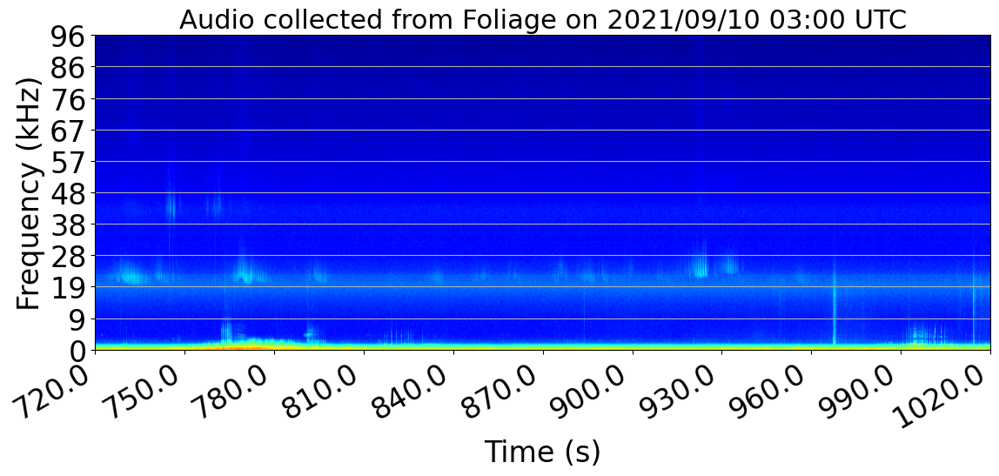

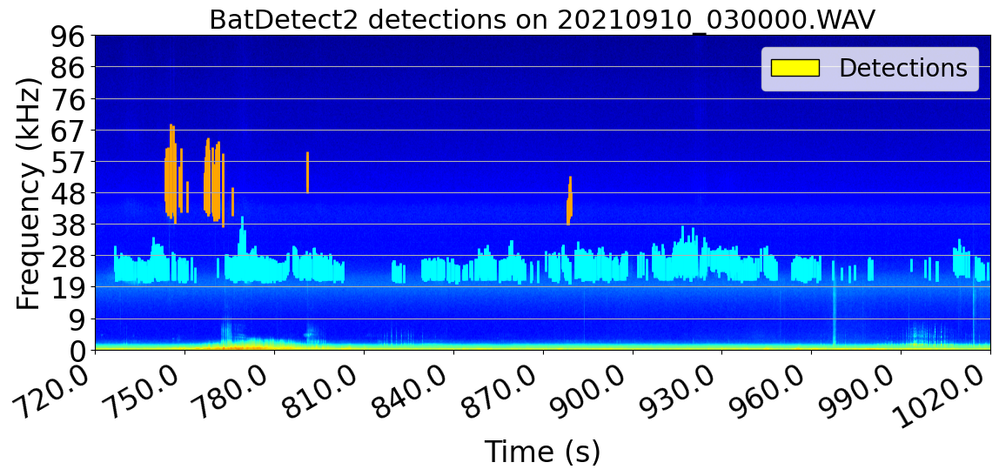

In [7]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[0]
filename = file_path.name
csv_path = Path(f'../batdetect2_outputs/recover-20210912/{site_key}/bd2_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 720
duration = 30
rm_dB = 60

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Foliage
Looking at 20210910_030000.WAV


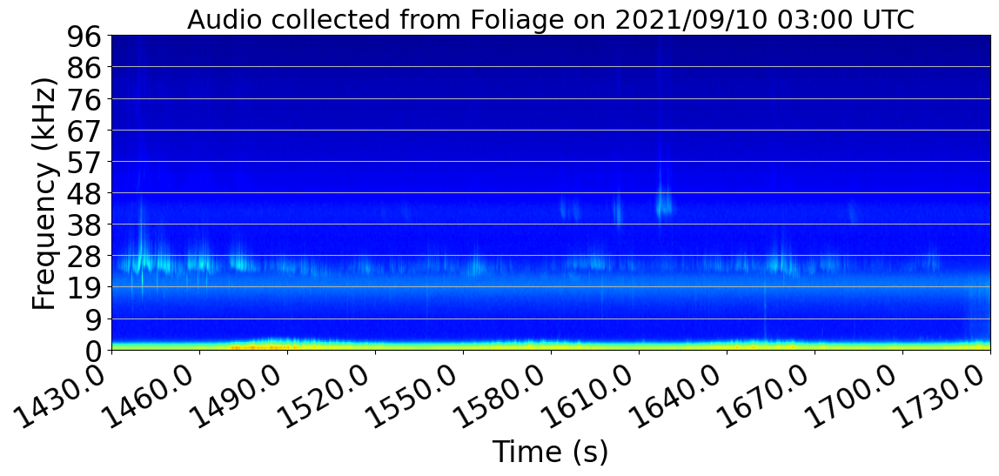

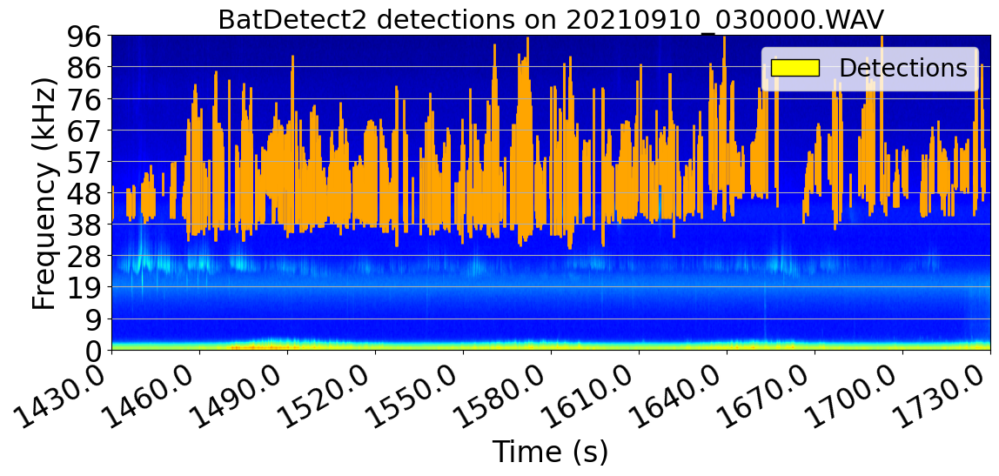

In [24]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[0]
print(f'Looking at {file_path.name}')
start = 1430
duration = 20
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB, nfft)

Looking at Foliage
Looking at 20210910_030000.WAV


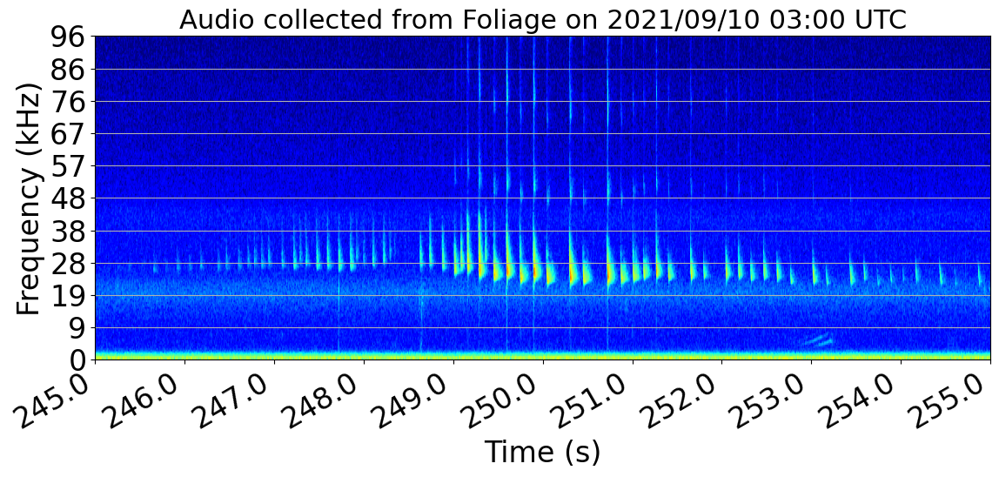

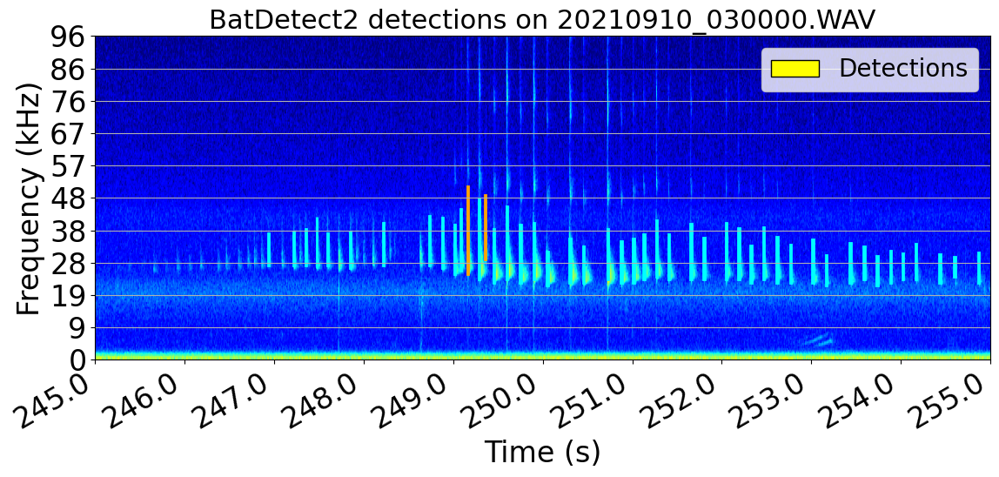

In [9]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[0]
print(f'Looking at {file_path.name}')
start = 245
duration = 10
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, duration, rm_dB, nfft)

Looking at Foliage
Looking at 20210910_030000.WAV


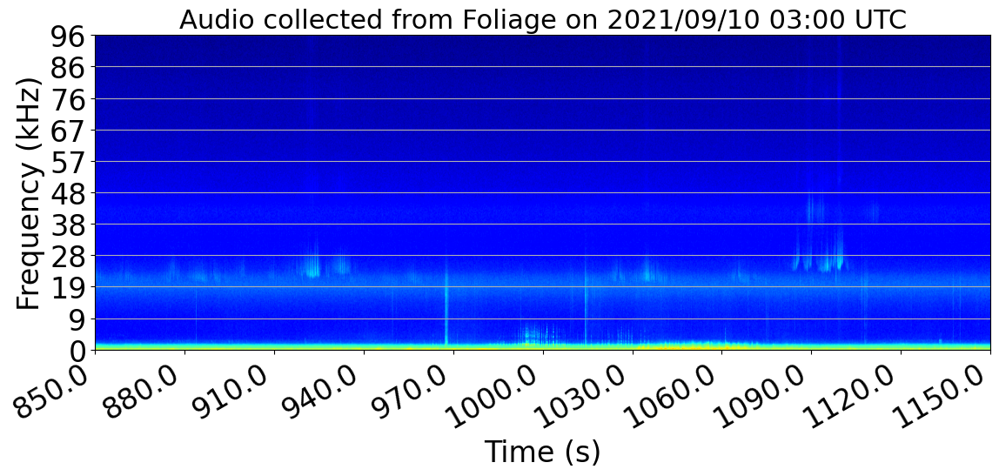

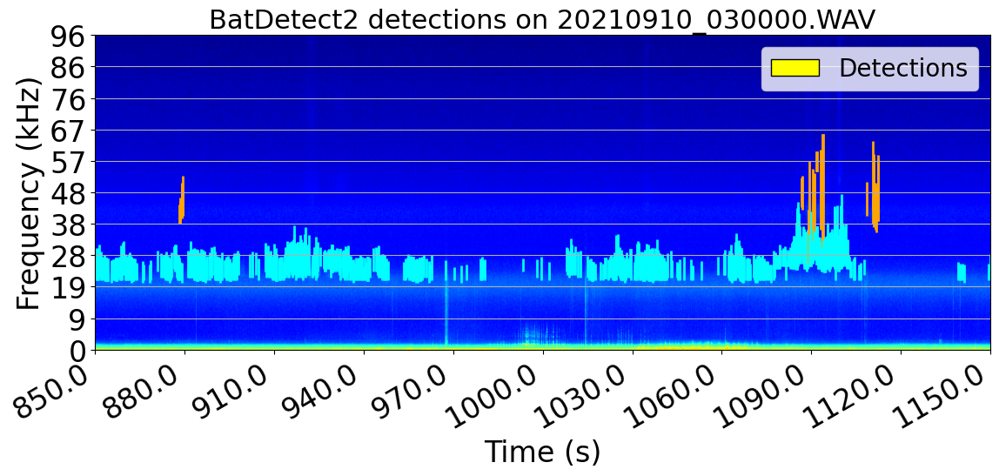

In [10]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[0]
print(f'Looking at {file_path.name}')
start = 850
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Foliage
Looking at 20220802_060000.WAV


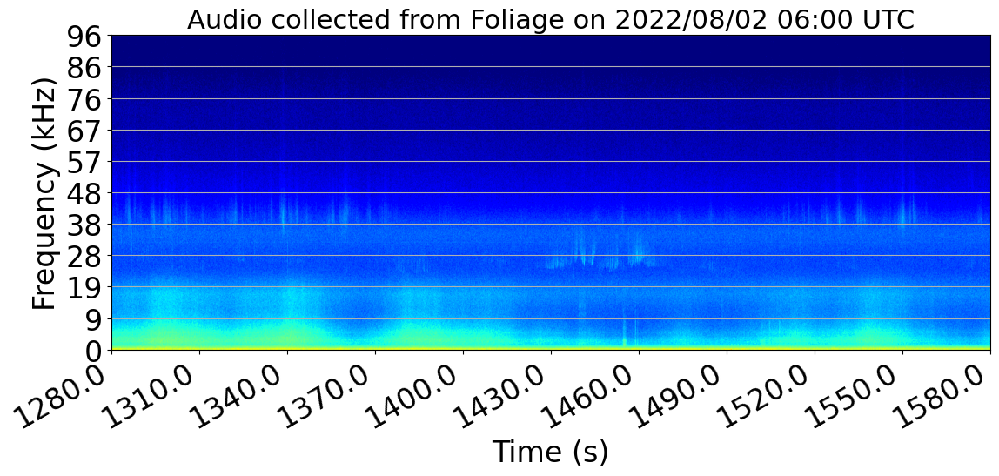

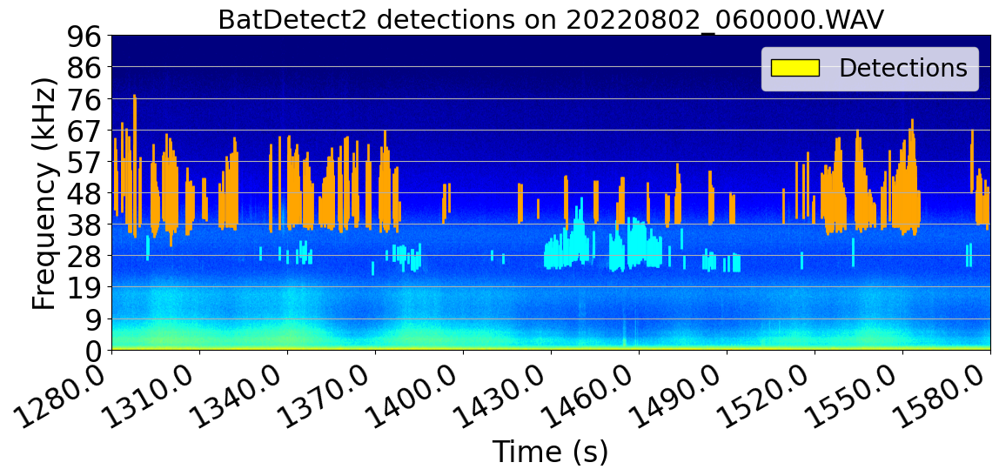

In [11]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[7]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1280
duration = 30
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Foliage
Looking at 20220802_060000.WAV


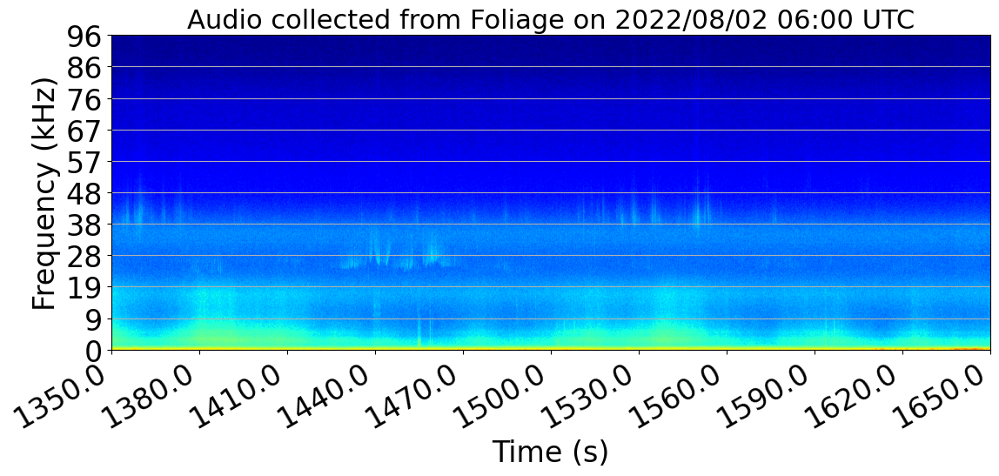

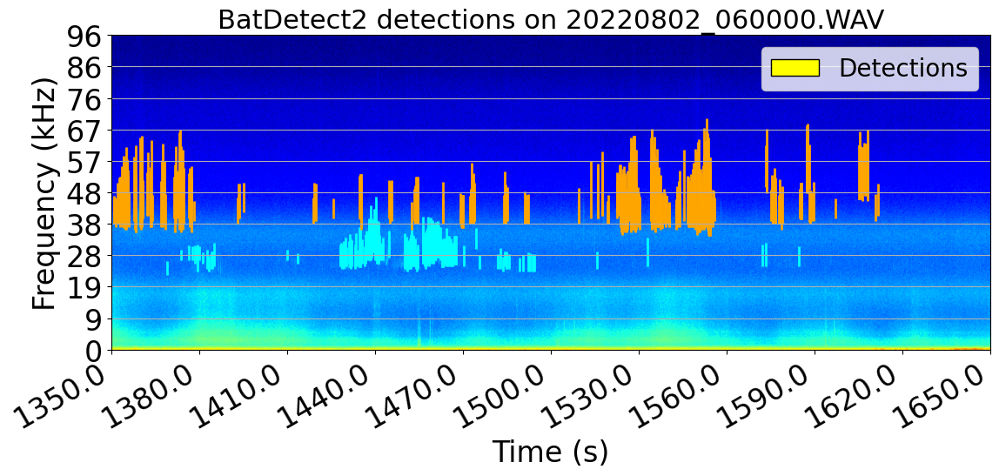

In [12]:
site_key = 'Foliage'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[7]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1350
duration = 30
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Carp Pond
Looking at 20220728_080000.WAV


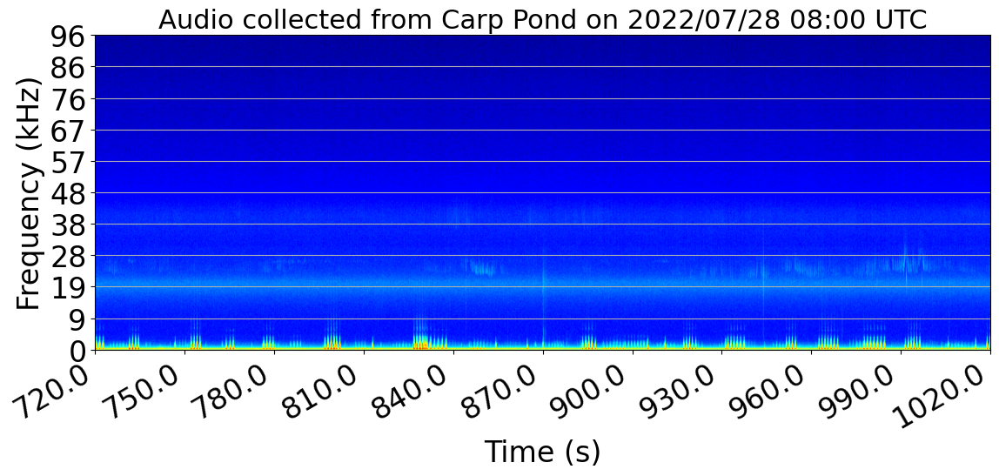

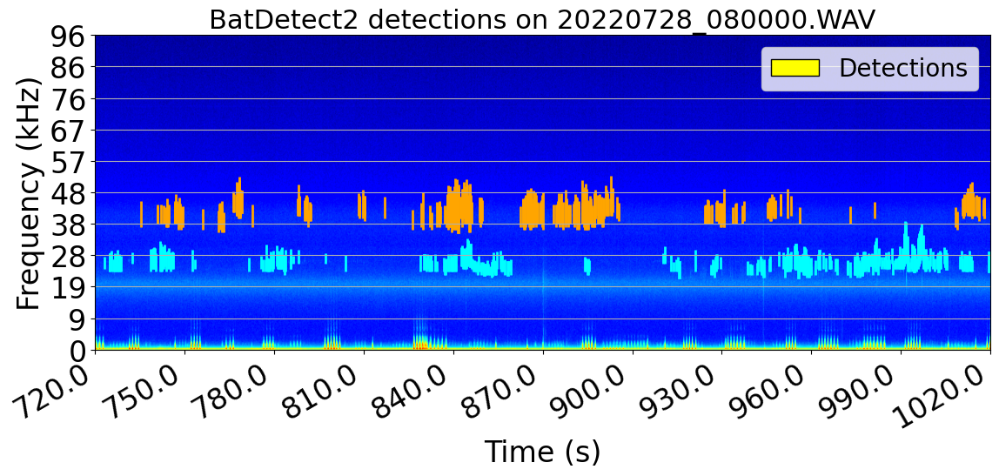

In [13]:
site_key = 'Carp'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[10]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 720
duration = 30
rm_dB = 60
nfft = 1024

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Carp Pond
Looking at 20220728_080000.WAV


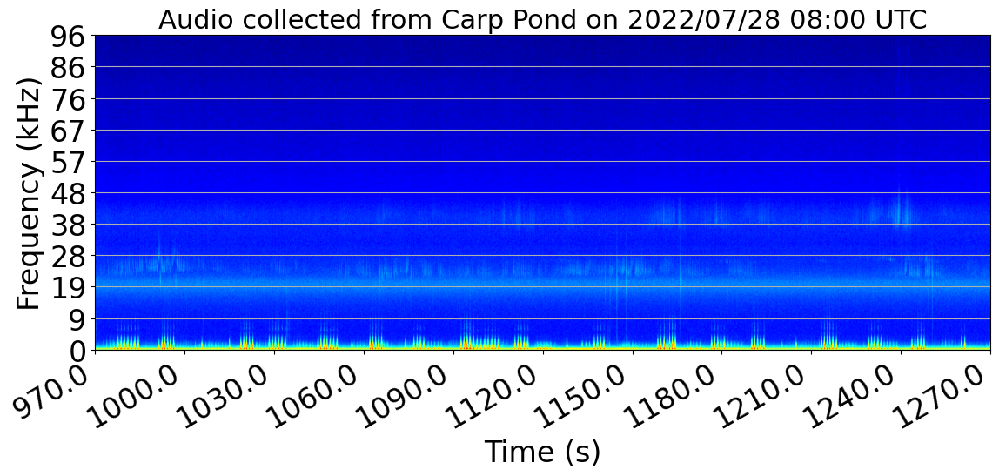

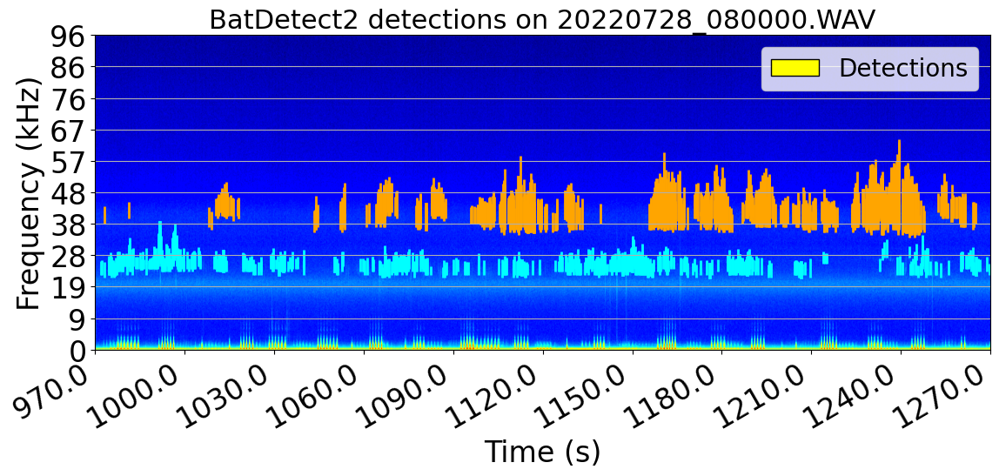

In [14]:
site_key = 'Carp'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[10]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 970
duration = 30
rm_dB = 60
nfft = 1024

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Carp Pond
Looking at 20221004_030000.WAV


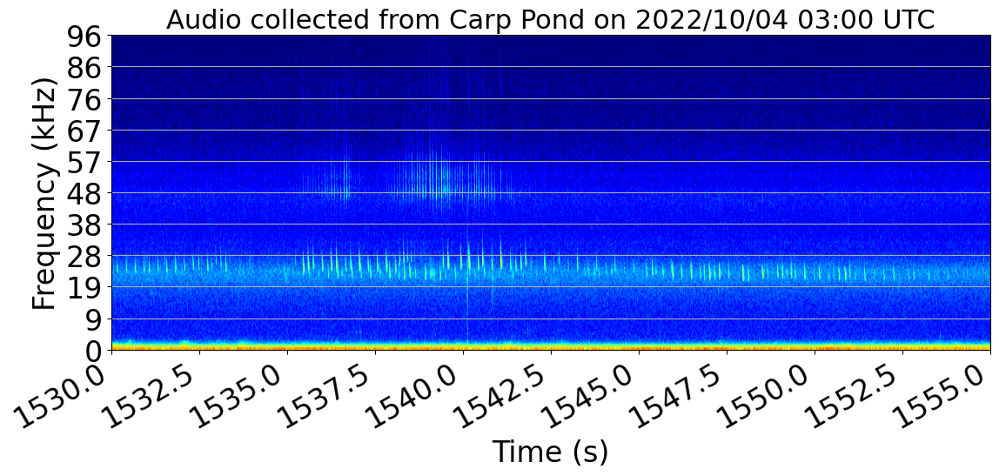

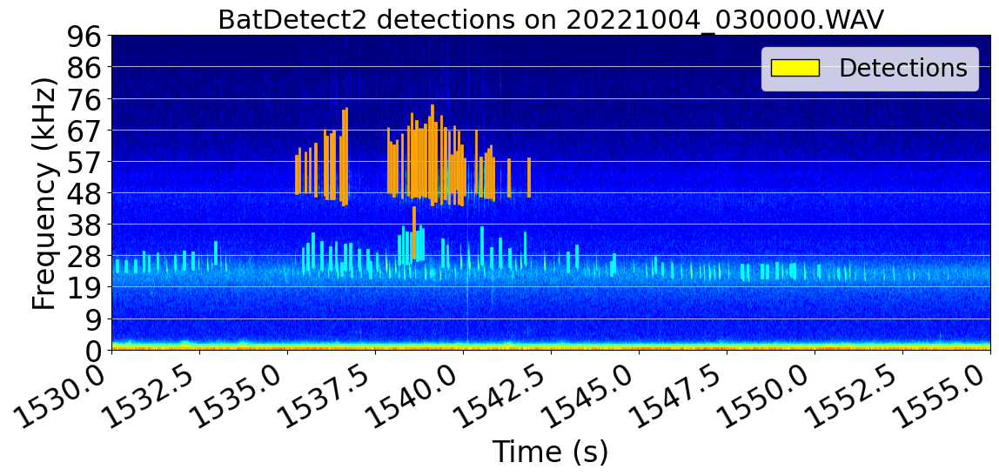

In [15]:
site_key = 'Carp'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[21]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1530
duration = 25
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, duration, rm_dB, nfft)

Looking at Carp Pond
Looking at 20221004_030000.WAV


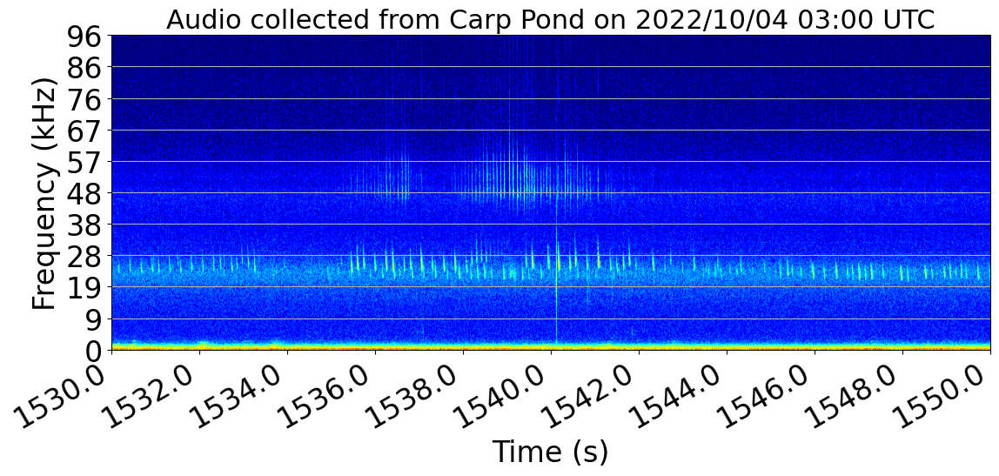

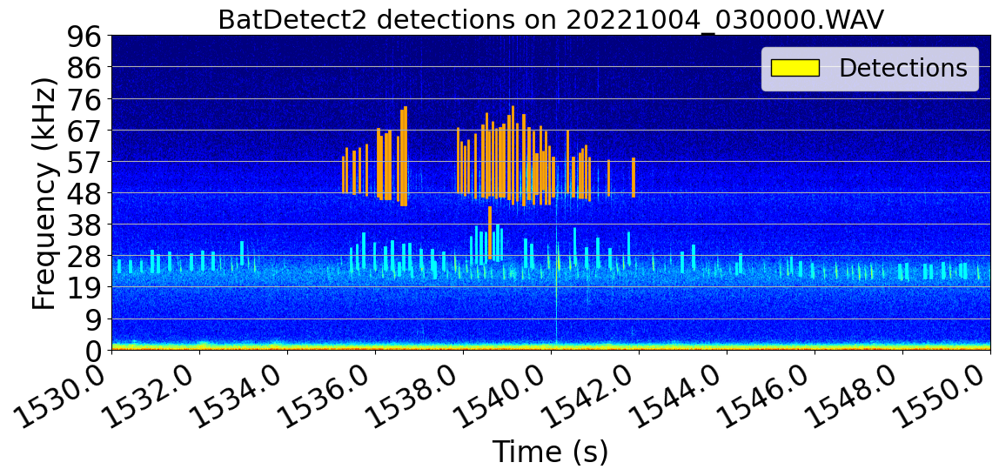

In [31]:
site_key = 'Carp'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[21]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1530
duration = 20
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, duration, rm_dB)

Looking at Central Pond
Looking at 20221004_023000.WAV


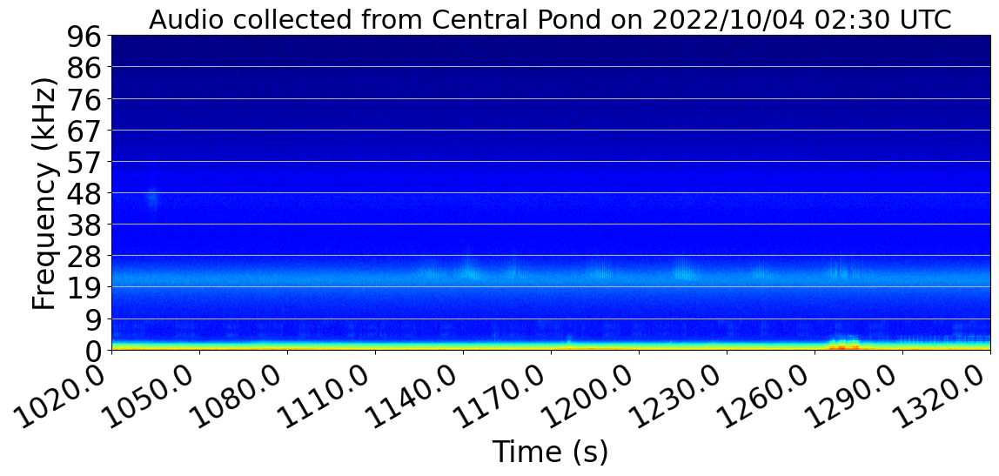

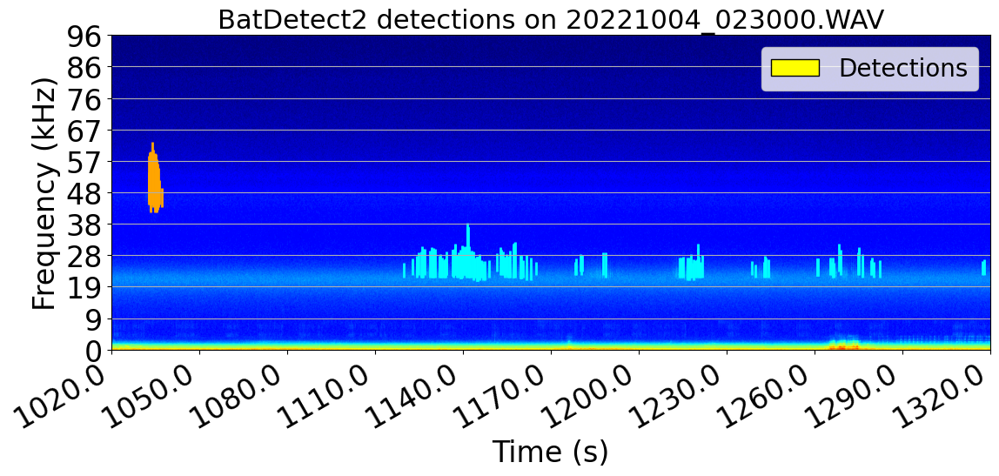

In [26]:
site_key = 'Central'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[21]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1020
duration = 25
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Central Pond
Looking at 20220826_070000.WAV


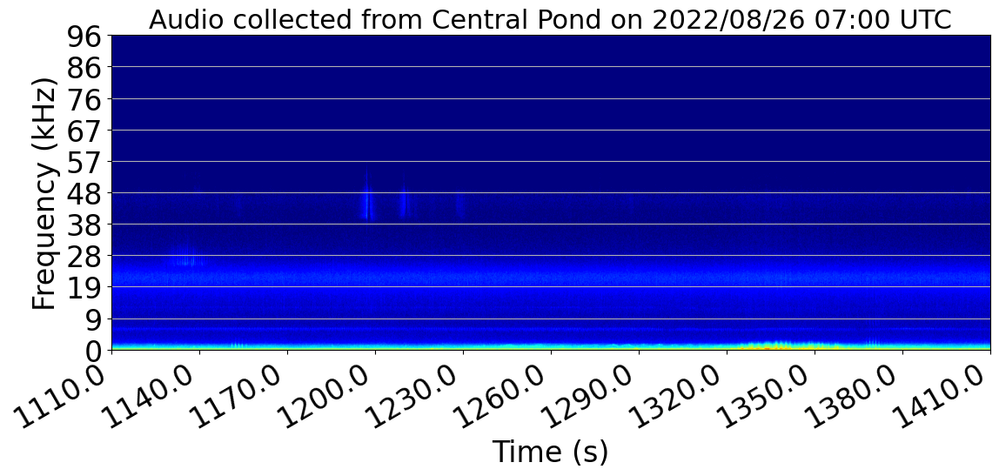

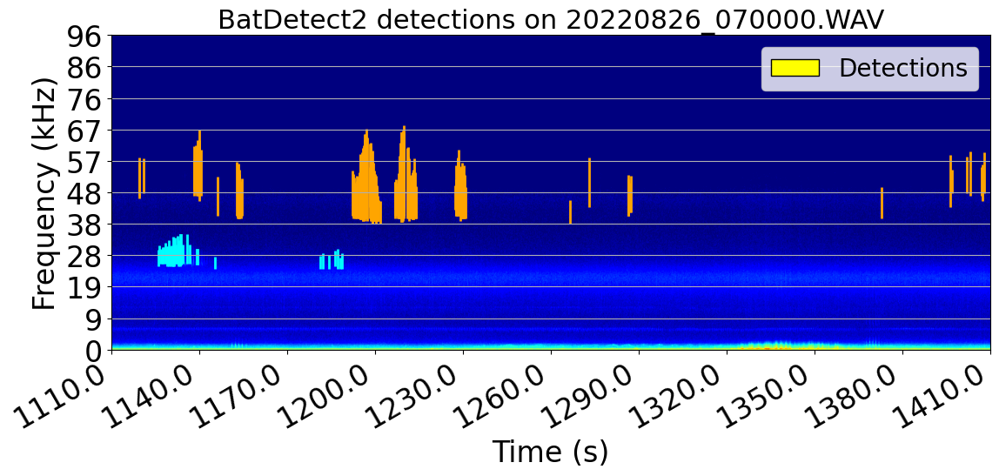

In [18]:
site_key = 'Central'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1110
duration = 25
rm_dB = 50
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Telephone Field
Looking at 20220820_070000.WAV


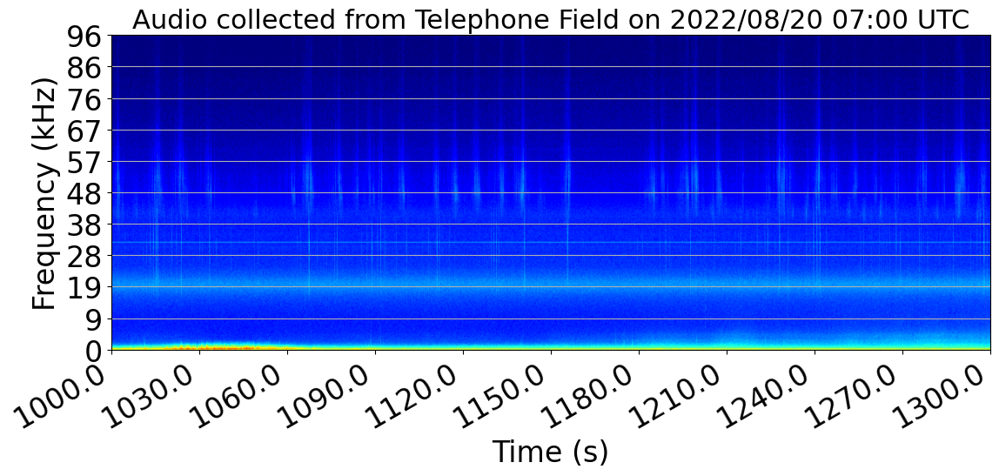

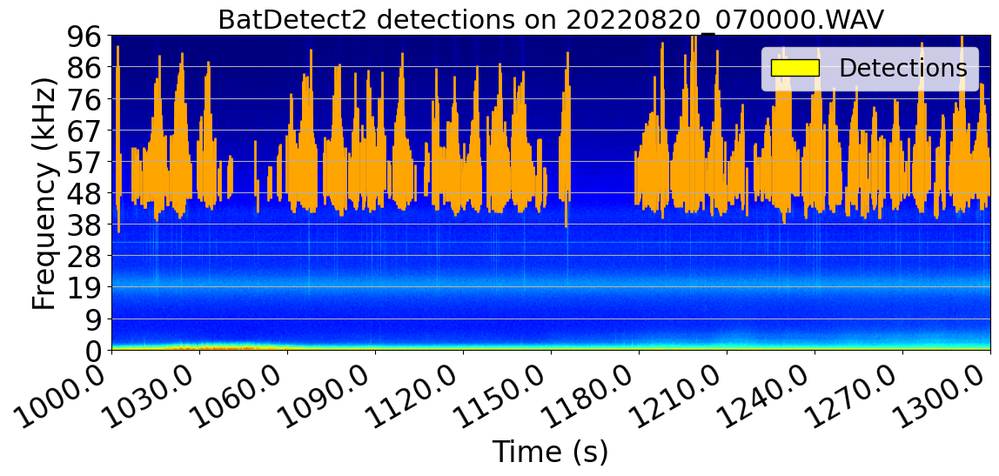

In [19]:
site_key = 'Telephone'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1000
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Telephone Field
Looking at 20220820_070000.WAV


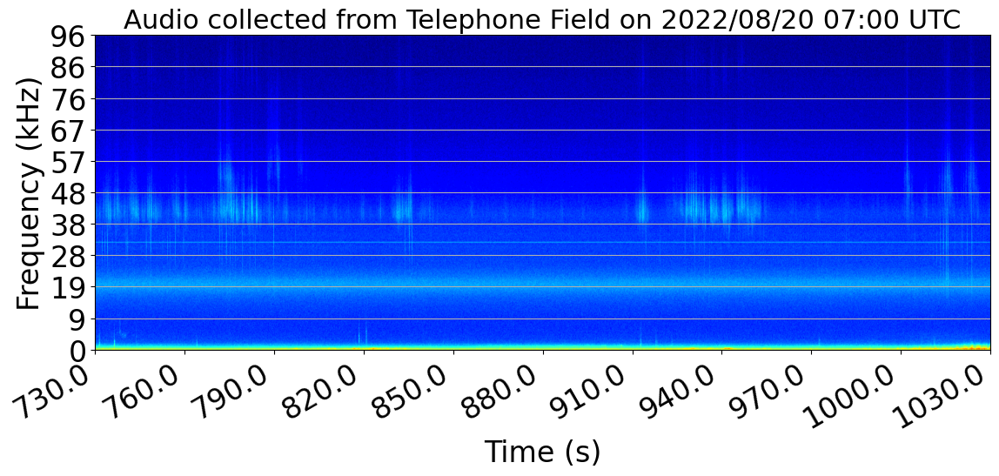

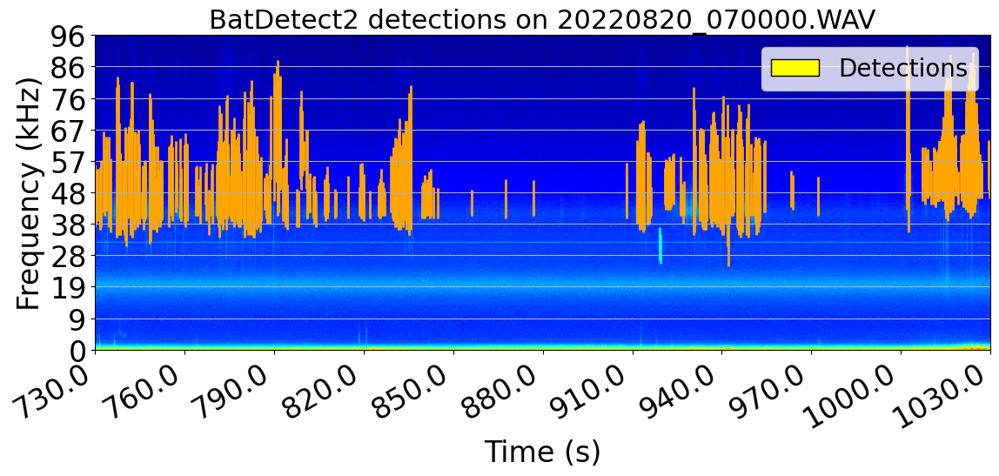

In [20]:
site_key = 'Telephone'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 730
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Telephone Field
Looking at 20220820_070000.WAV


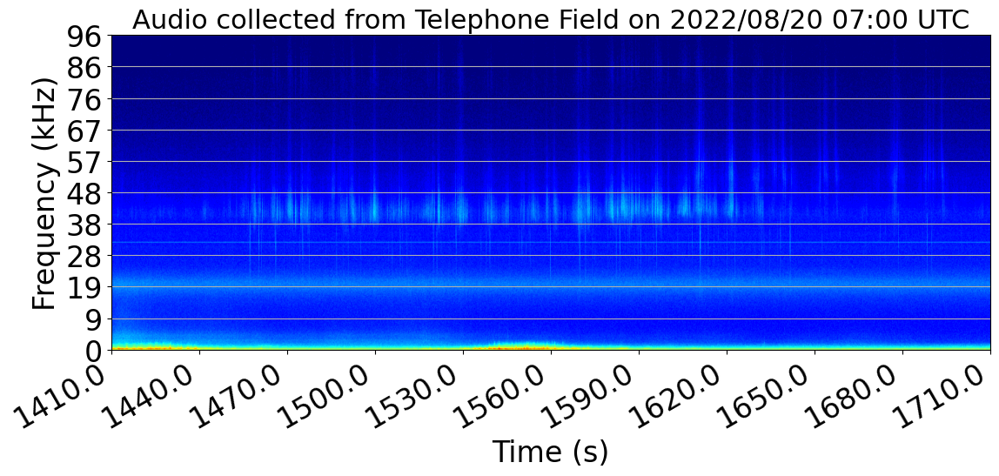

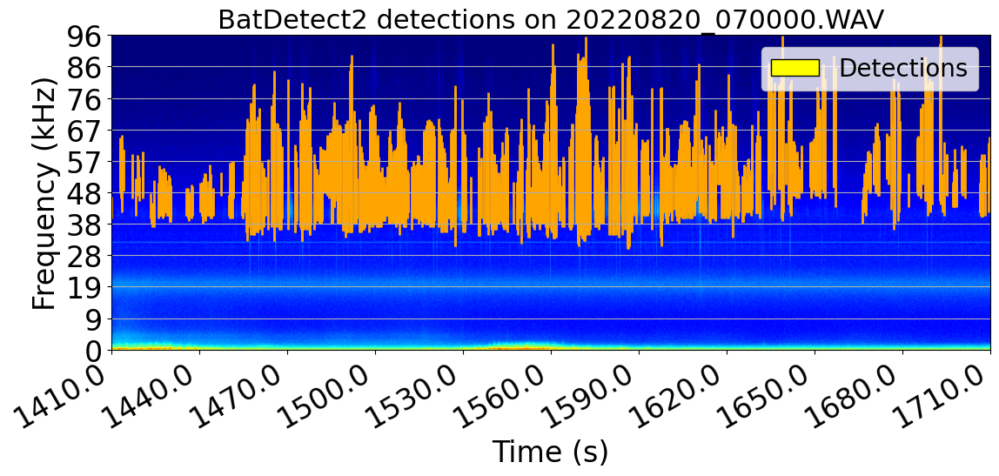

In [21]:
site_key = 'Telephone'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1410
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Telephone Field
Looking at 20220820_070000.WAV


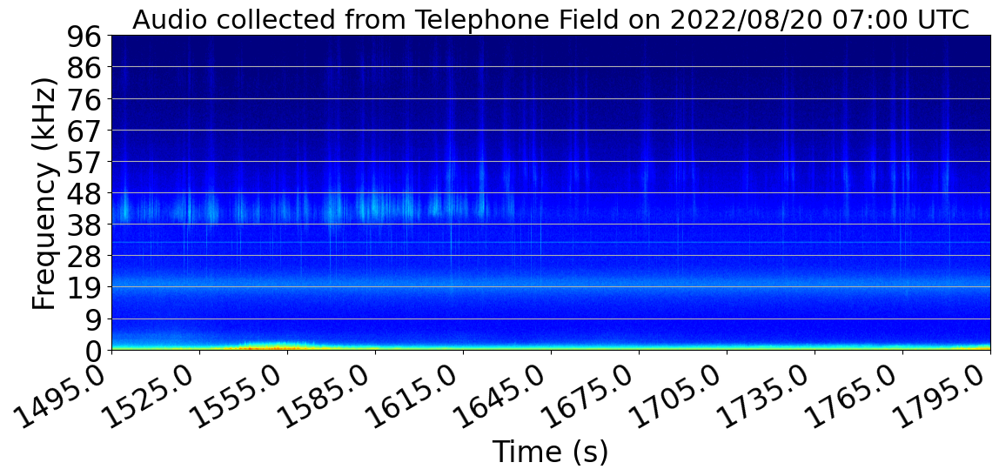

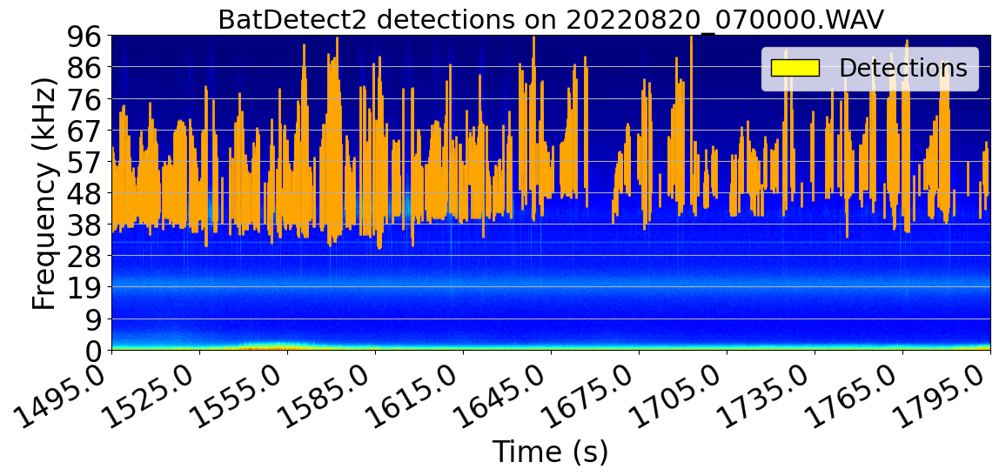

In [27]:
site_key = 'Telephone'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1495
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)

Looking at Telephone Field
Looking at 20220820_070000.WAV


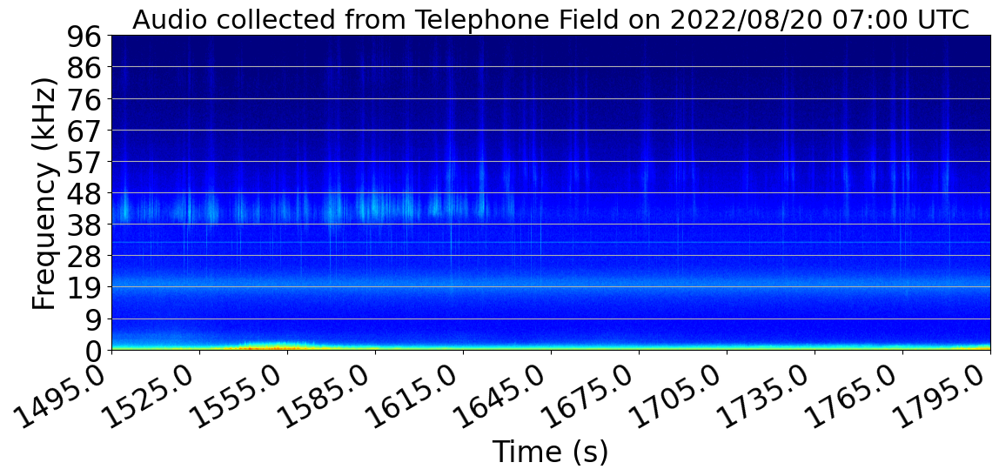

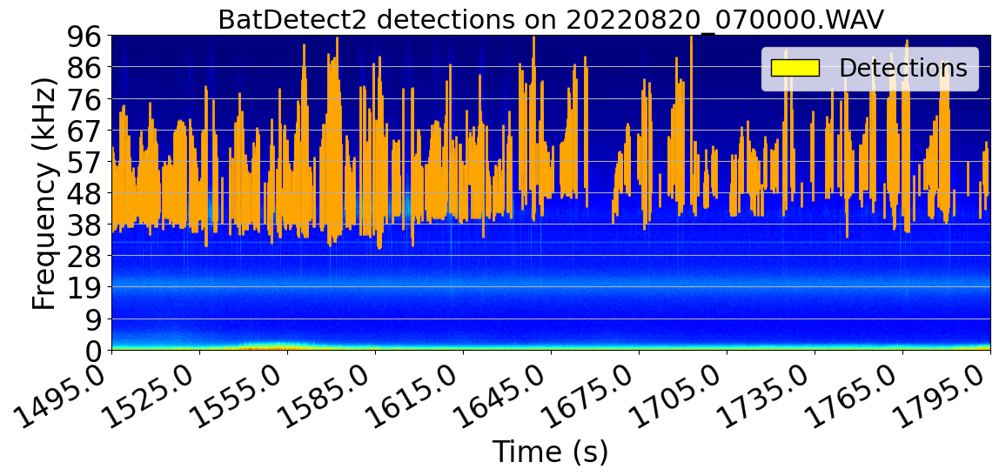

In [28]:
site_key = 'Telephone'

fig_details = dict()
fig_details['site_name'] = SITE_NAMES[site_key]
print(f'Looking at {fig_details["site_name"]}')
files_from_loc = sorted(list(Path(f'../data/audiomoth_recordings/').glob(pattern=f'*/{site_key}/*.WAV')))

file_path = files_from_loc[8]
filename = file_path.name
csv_path = Path(f'../data/raw/{site_key}/bd2__{site_key}_{filename.split(".")[0]}.csv')
print(f'Looking at {file_path.name}')
start = 1495
duration = 30
rm_dB = 60
nfft = 512

load_and_plot_file(file_path, csv_path, start, DURATION, rm_dB)